In [1]:
# Imports four essential libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Import the os module which provides a way to interact with the operating system
# This module includes functions for file and directory operations, environment variables, etc.
import os

In [3]:
# List all files and directories in the specified path
# This helps to see what datasets are available for the Uber data analysis project
os.listdir(r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
uber_15 = pd.read_csv(r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets\uber-raw-data-janjune-15_sample.csv")

In [5]:
uber_15.head(5) 

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140


In [6]:
# Get the dimensions of the uber_15 dataframe
# Returns a tuple with (number of rows, number of columns)
uber_15.shape

(100000, 4)

In [7]:
# Check the data type of the 'uber_15' variable
# This helps verify if it's a DataFrame, Series, or another data structure
type(uber_15)

pandas.core.frame.DataFrame

In [8]:
# Check how many duplicate rows exist in the uber_15 dataframe
# .duplicated() returns a boolean Series identifying duplicate rows
# .sum() counts the number of True values (i.e., the number of duplicates)
uber_15.duplicated().sum()

np.int64(54)

In [9]:
# Remove duplicate rows from the uber_15 dataframe and modify the dataframe in-place
uber_15.drop_duplicates(inplace=True)

In [10]:
uber_15.duplicated().sum()

np.int64(0)

In [11]:
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [12]:
uber_15.shape

(99946, 4)

In [13]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [14]:
# Check for missing values in the uber_15 DataFrame
# Returns a DataFrame of the same shape as uber_15 with boolean values:
# True for cells that contain null values and False for non-null values
uber_15.isnull()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
99995,False,False,False,False
99996,False,False,False,False
99997,False,False,False,False
99998,False,False,False,False


In [15]:
# Check for missing values in the uber_15 dataframe
# Returns a count of null values for each column
uber_15.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

In [16]:
uber_15['Pickup_date'][0]

'2015-05-02 21:43:00'

In [17]:
type(uber_15['Pickup_date'][0])

str

In [18]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'])

In [19]:
uber_15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140
...,...,...,...,...
99995,B02764,2015-04-13 16:12:00,B02764,234
99996,B02764,2015-03-06 21:32:00,B02764,24
99997,B02598,2015-03-19 19:56:00,B02598,17
99998,B02682,2015-05-02 16:02:00,B02682,68


In [20]:
uber_15['Pickup_date'] .dtype

dtype('<M8[ns]')

In [21]:
uber_15['Pickup_date'][0]

Timestamp('2015-05-02 21:43:00')

In [22]:
type(uber_15['Pickup_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [23]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [24]:
# Analyze which month has the maximum number of Uber pickups
# This comment indicates we're looking to identify the month with highest pickup frequency

In [25]:
uber_15['Pickup_date'].dt.month_name()

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: Pickup_date, Length: 99946, dtype: object

In [26]:
uber_15['month'] = uber_15['Pickup_date'].dt.month_name()

In [27]:
uber_15['month']

0            May
1        January
2          March
3          April
4          March
          ...   
99995      April
99996      March
99997      March
99998        May
99999       June
Name: month, Length: 99946, dtype: object

<Axes: xlabel='month'>

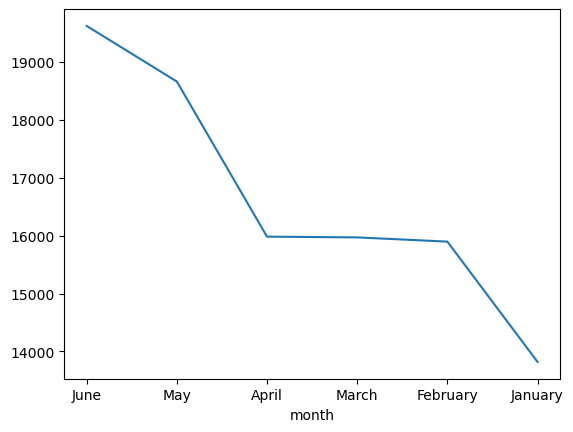

In [28]:
uber_15['month'].value_counts().plot()

In [29]:
# Extract time-related features from the Pickup_date column
uber_15['Weekday'] = uber_15['Pickup_date'].dt.day_name()  # Extract day name (Monday, Tuesday, etc.)
uber_15['day'] = uber_15['Pickup_date'].dt.day             # Extract day of month (1-31)
uber_15['hour'] = uber_15['Pickup_date'].dt.hour           # Extract hour (0-23)
uber_15['minute'] = uber_15['Pickup_date'].dt.minute       # Extract minute (0-59)

In [30]:
uber_15.head(5)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,Weekday,day,hour,minute
0,B02617,2015-05-02 21:43:00,B02764,237,May,Saturday,2,21,43
1,B02682,2015-01-20 19:52:59,B02682,231,January,Tuesday,20,19,52
2,B02617,2015-03-19 20:26:00,B02617,161,March,Thursday,19,20,26
3,B02764,2015-04-10 17:38:00,B02764,107,April,Friday,10,17,38
4,B02764,2015-03-23 07:03:00,B00111,140,March,Monday,23,7,3


In [31]:
# Create a pivot table (cross-tabulation) that counts occurrences of each month-weekday combination
# - Rows (index): months from the uber_15 dataframe
# - Columns: days of the week from the uber_15 dataframe
# This gives us a frequency table showing how many rides occurred on each weekday within each month
Pivot = pd.crosstab(index = uber_15['month'], columns = uber_15['Weekday'])

In [32]:
Pivot

Weekday,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
month,,,,,,,
April,2365,1833,2508,2052,2823,1880,2521
February,2655,1970,2550,2183,2396,2129,2013
January,2508,1353,2745,1651,2378,1444,1740
June,2793,2848,3037,2485,2767,3187,2503
March,2465,2115,2522,2379,2093,2388,2007
May,3262,1865,3519,2944,2627,2115,2328


<Axes: xlabel='month'>

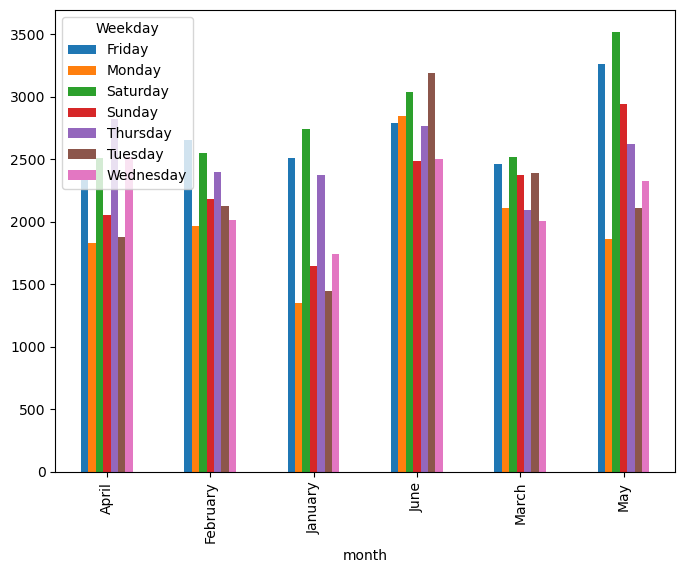

In [33]:
#grouped bar chart
Pivot.plot(kind = 'bar', figsize = (8,6))

In [34]:
# Analysing Hourly rush in New York
# Group the Uber data by both weekday and hour, counting the number of rides in each group
# This creates a summary DataFrame showing ride frequency patterns across different days and times
Summary = uber_15.groupby(['Weekday','hour'], as_index = False).size()

In [35]:
Summary

,Weekday,hour,size
0,Friday,0,581
1,Friday,1,333
2,Friday,2,197
3,Friday,3,138
4,Friday,4,161
...,...,...,...
163,Wednesday,19,1044
164,Wednesday,20,897
165,Wednesday,21,949
166,Wednesday,22,900


<Axes: xlabel='hour', ylabel='size'>

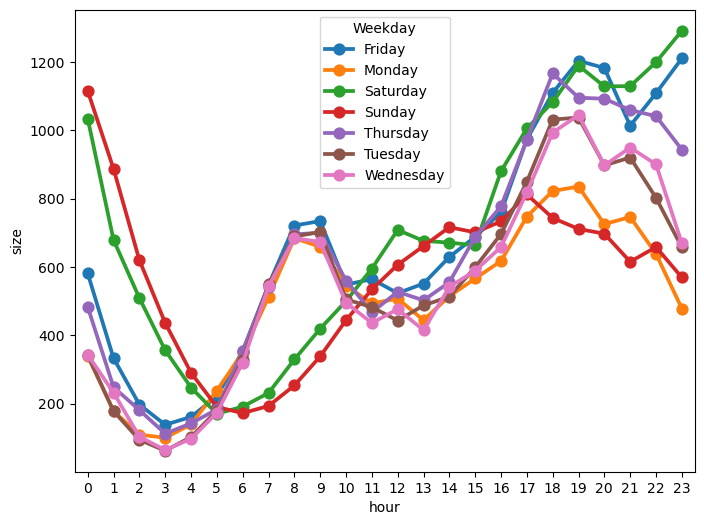

In [36]:
plt.figure(figsize = (8,6))
sns.pointplot(x = 'hour', y= 'size', hue = 'Weekday', data = Summary)

In [37]:
# Get the column names of the uber_15 DataFrame to understand its structure
# This helps identify available fields for analyzing the most active uber base
uber_15.columns

Index(['Dispatching_base_num', 'Pickup_date', 'Affiliated_base_num',
       'locationID', 'month', 'Weekday', 'day', 'hour', 'minute'],
      dtype='object')

In [38]:
os.listdir(r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [39]:
uber_foil = pd.read_csv(r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets\Uber-Jan-Feb-FOIL.csv")

In [40]:
uber_foil.shape

(354, 4)

In [41]:
uber_foil.head(3)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421


In [42]:
#5 Point supmmary
#plotly box plot
!pip install chart_studio
!pip install plotly

In [43]:
# Import Plotly's chart studio module for publishing charts online
import chart_studio.plotly as py
# Import Plotly's graph objects for creating interactive visualizations
import plotly.graph_objs as go
# Import Plotly Express for simplified high-level interface to create figures
import plotly.express as px
# Import offline functions to use Plotly without requiring an internet connection
from plotly.offline import download_plotlyjs,init_notebook_mode, plot, iplot

In [44]:
# Initialize the notebook mode for Plotly with internet connection enabled
# This allows Plotly figures to be displayed in the notebook
init_notebook_mode(connected = True)

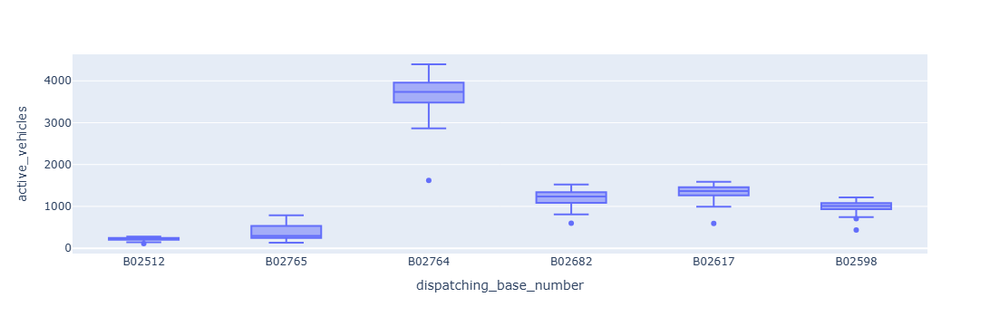

In [45]:
# Create a box plot using Plotly Express
# x-axis: dispatching_base_number (categorical variable showing different Uber bases)
# y-axis: active_vehicles (numerical variable showing count of active vehicles)
# data_frame: using the uber_foil dataframe as the data source
px.box(x = 'dispatching_base_number', y = 'active_vehicles', data_frame = uber_foil)

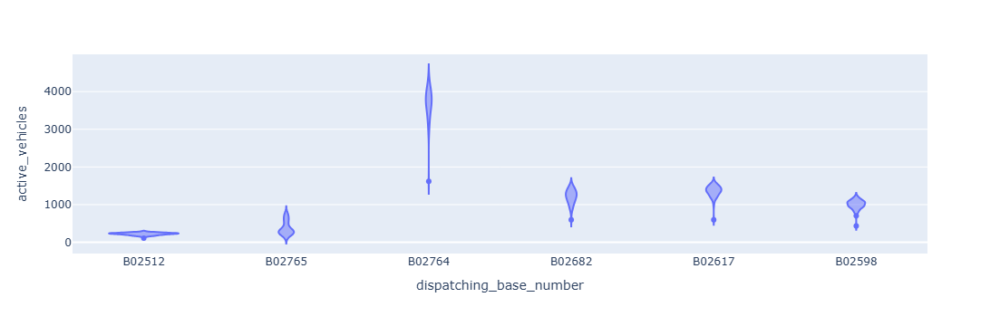

In [46]:
# Create a violin plot to visualize the distribution of active vehicles across different dispatching bases
# x-axis: dispatching_base_number - represents different Uber dispatching bases
# y-axis: active_vehicles - shows the count of active vehicles for each base
# data_frame: uber_foil - the DataFrame containing our Uber data
px.violin(x = 'dispatching_base_number', y = 'active_vehicles', data_frame = uber_foil)

In [47]:
#Collect entire data: data collection


In [48]:
folder_path = (r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets")[-8:]

In [49]:
import os

# Define the path to the folder containing datasets
folder_path = r"C:\Users\punam.patil\OneDrive - Energy Exemplar Pty Ltd\2025 Goals\Projects\Uber data analysis\Datasets"

# Get a list of all files in the specified folder
files = os.listdir(folder_path) 
# Sort the files alphabetically
files.sort()           
# Extract the last 8 files from the sorted list
last_8_files = files[-8:]       

# Print header for the output
print("Last 8 files:")
# Iterate through the last 8 files and print each filename
for file in last_8_files:
    print(file)

Last 8 files:
uber-raw-data-apr14.csv
uber-raw-data-aug14.csv
uber-raw-data-janjune-15.csv
uber-raw-data-janjune-15_sample.csv
uber-raw-data-jul14.csv
uber-raw-data-jun14.csv
uber-raw-data-may14.csv
uber-raw-data-sep14.csv


In [50]:

# Remove specific files from the last 8 list if they exist
for f in ['uber-raw-data-janjune-15.csv', 'uber-raw-data-janjune-15_sample.csv']:
    if f in last_8_files:
        last_8_files.remove(f)

In [51]:
# Read all remaining files into a list of DataFrames
dfs = []
for file in last_8_files:
    file_path = os.path.join(folder_path, file)
    curr_df = pd.read_csv(file_path)
    dfs.append(curr_df)

In [52]:
# Concatenate all DataFrames into one
final = pd.concat(dfs, ignore_index=True)

In [53]:
print(final.head())
    

          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512


In [54]:
final.shape

(4534327, 4)

In [55]:
final.head(5)

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [56]:
final.duplicated().sum()

np.int64(82581)

In [57]:
final.drop_duplicates(inplace = True )

In [58]:
final.shape

(4451746, 4)

In [59]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512


In [60]:
# Perform spatial analysis to find areas with high concentration of Uber pickups
# Group data by latitude and longitude coordinates, counting occurrences at each location
# This creates a dataframe with columns 'Lat', 'Lon', and 'size' (count of pickups at each coordinate)
# The resulting dataframe 'rush_uber' will be used to create a heat map visualization
rush_uber = final.groupby(['Lat' , 'Lon'] , as_index = False).size()

In [61]:
rush_uber.head(5)

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1


In [62]:
# Install the folium library which is used for creating interactive maps in Python
!pip install folium

In [63]:
import folium

In [64]:
basemap = folium.Map()

In [65]:
basemap

In [66]:
from folium.plugins import HeatMap

In [67]:
HeatMap(rush_uber).add_to(basemap)

In [68]:
basemap

In [69]:
#perform pair wise analysis to figure out Rush

final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base'], dtype='object')

In [70]:
final.head(3)

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512


In [71]:
final.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [72]:
final['Date/Time'][0]

'4/1/2014 0:11:00'

In [ ]:
final['Date/Time'] = pd.to_datetime(final['Date/Time'], format = "%m/%d/%Y %H:%M:%S")

In [ ]:
final['Date/Time'].head(5)

In [ ]:
final['Date/Time'].dtype

In [ ]:
final['day'] = final['Date/Time'].dt.day
final['hour'] = final['Date/Time'].dt.hour

In [ ]:
final.head(4)

In [ ]:
pivot = final.groupby(['day', 'hour']).size().unstack()

In [ ]:
pivot

In [ ]:
pivot.style.background_gradient()

In [ ]:
#how to automate your anlysis
def gen_pivot_table(df, col1, col2):
    pivot = final.groupby(['day', 'hour']).size().unstack()
    return pivot.style.background_gradient()

In [ ]:
gen_pivot_table(final,'day','hour')